# extraction of components of usernames and analysis

In [1]:
# import the necessary libraries you need for your analysis
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Floats (decimal numbers) should be displayed rounded with 2 decimal places
pd.options.display.float_format = "{:,.2f}".format
# Set style for plots
plt.style.use('fivethirtyeight') 

In [3]:
# read in csv file and display first 5 rows of datset
df = pd.read_csv("/Users/aileenpfleiderer/Documents/WorkspaceAileen /Capstone-Project-DataCVPro/df_entropy.csv")
df.head()

,username,type,site_admin,public_repos,public_gists,followers,following,created_at,updated_at,duration,entropy,branding_evaluation,standardized_entropy,entropy_classification,year
0,mojombo,User,False,66,62,23655,11,2007-10-20 05:24:19+00:00,2023-09-18 18:49:27+00:00,5812 days,1.84,Not so good,0.31,Low,2007
1,defunkt,User,False,107,273,21736,214,2007-10-20 05:24:19+00:00,2023-09-29 23:19:40+00:00,5823 days,2.81,Not so good,0.47,Medium,2007
2,pjhyett,User,False,8,21,8259,30,2008-01-07 17:54:22+00:00,2023-03-20 06:54:31+00:00,5550 days,2.52,Not so good,0.42,Medium,2008
3,wycats,User,False,282,761,10152,13,2008-01-12 05:38:33+00:00,2023-09-20 01:24:31+00:00,5729 days,2.58,Not so good,0.43,Medium,2008
4,ezmobius,User,False,22,106,545,13,2008-01-12 07:51:46+00:00,2023-09-22 11:24:10+00:00,5732 days,3.00,Not so good,0.50,Medium,2008


In [4]:
# check which columns are included in our dataframe
df.columns

Index(['username', 'type', 'site_admin', 'public_repos', 'public_gists',
       'followers', 'following', 'created_at', 'updated_at', 'duration',
       'entropy', 'branding_evaluation', 'standardized_entropy',
       'entropy_classification', 'year'],
      dtype='object')

In [5]:
# Let's have a look at the shape of our dataset, meaning how long and wide it is.
df.shape

(140941, 15)

In [6]:
# try to extract components of usernames
# e.g. lenght, kind of different characters, kind of special characters

# lenght
import pandas as pd

# Calculate the length of usernames and store them in a new column
df['length_username'] = df['username'].apply(len)

# Display the results
print(df)



                     username  type  site_admin  public_repos  public_gists  \
0                     mojombo  User       False            66            62   
1                     defunkt  User       False           107           273   
2                     pjhyett  User       False             8            21   
3                      wycats  User       False           282           761   
4                    ezmobius  User       False            22           106   
...                       ...   ...         ...           ...           ...   
140936           MadheswaranU  User       False             2             0   
140937              Rizuvanul  User       False             0             0   
140938  NISHANTHISENTHILKUMAR  User       False             0             0   
140939           dredwardhyde  User       False             7             0   
140940         Bundlr-Network  User       False             0             0   

        followers  following                 create

In [7]:
# Use the describe function for the length_username column
description = df['length_username'].describe()

# Display the summary statistics
print(description)


count   140,941.00
mean          9.33
std           3.10
min           1.00
25%           7.00
50%           9.00
75%          11.00
max          35.00
Name: length_username, dtype: float64


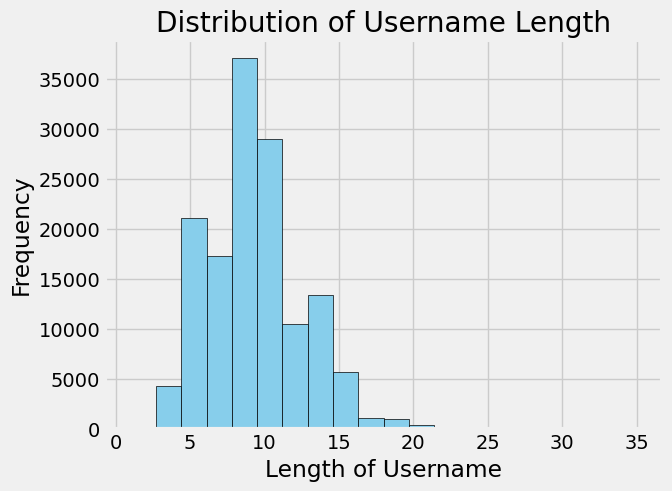

In [8]:
import matplotlib.pyplot as plt

# Plot a histogram of the length_username column
plt.hist(df['length_username'], bins=20, color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel('Length of Username')
plt.ylabel('Frequency')
plt.title('Distribution of Username Length')

# Show the plot
plt.show()


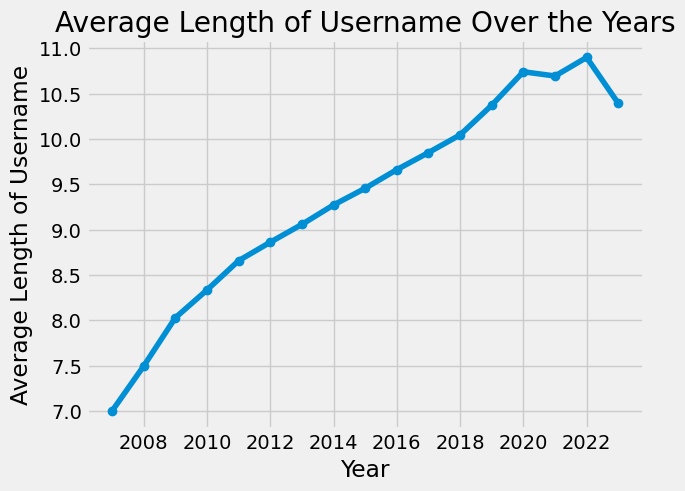

In [9]:
import matplotlib.pyplot as plt

# Group the data by year and calculate the mean of the length_username column for each year
mean_length_by_year = df.groupby('year')['length_username'].mean()

# Plot a line plot of the mean length of usernames over the years
plt.plot(mean_length_by_year.index, mean_length_by_year.values, marker='o')

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Average Length of Username')
plt.title('Average Length of Username Over the Years')

# Show the plot
plt.grid(True)
plt.show()


In [10]:
# counting different kind of letters/characters in each username

# Counting the number of different letters in each username and saving the results in a new column
df['letters_username'] = df['username'].apply(lambda x: len(set(x)))

# Displaying the DataFrame with the new column
print(df)



                     username  type  site_admin  public_repos  public_gists  \
0                     mojombo  User       False            66            62   
1                     defunkt  User       False           107           273   
2                     pjhyett  User       False             8            21   
3                      wycats  User       False           282           761   
4                    ezmobius  User       False            22           106   
...                       ...   ...         ...           ...           ...   
140936           MadheswaranU  User       False             2             0   
140937              Rizuvanul  User       False             0             0   
140938  NISHANTHISENTHILKUMAR  User       False             0             0   
140939           dredwardhyde  User       False             7             0   
140940         Bundlr-Network  User       False             0             0   

        followers  following                 create

In [11]:
# Use the describe function for the letters_username column
description = df['letters_username'].describe()

# Display the summary statistics
print(description)

count   140,941.00
mean          7.57
std           2.15
min           1.00
25%           6.00
50%           7.00
75%           9.00
max          21.00
Name: letters_username, dtype: float64


In [12]:
# checking whether this has worked? checking the username for the max and min letters_username

# Finding the maximum and minimum number of unique letters in usernames
max_letters = df['letters_username'].max()
min_letters = df['letters_username'].min()

# Filtering the DataFrame to get the usernames with the maximum and minimum number of unique letters
usernames_max_letters = df[df['letters_username'] == max_letters]['username'].tolist()
usernames_min_letters = df[df['letters_username'] == min_letters]['username'].tolist()

# Displaying the usernames
print("Usernames with maximum unique letters:", usernames_max_letters)
print("Usernames with minimum unique letters:", usernames_min_letters)


Usernames with maximum unique letters: ['Alive-AttemptTheLifeGangHouse']
Usernames with minimum unique letters: ['JJ', 'tt', 'yy', 'hh', 'b', 'm', 'z', 'r', 'q', '-', 'l', 'JJJ', 'p', '0', '6', 'o', 'f', 'd', 'j', 'v', 'x', 'A', 's', 'llllllllll', 'h', '11', 'xxxxxx']


In [13]:
# seems to be working 

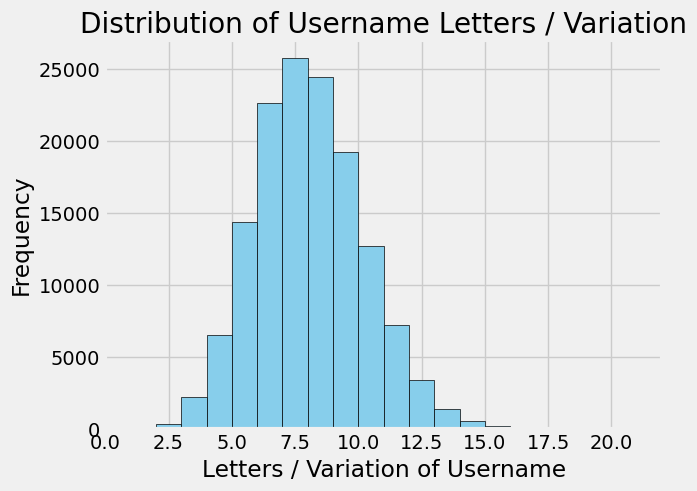

In [14]:
import matplotlib.pyplot as plt

# Plot a histogram of the length_username column
plt.hist(df['letters_username'], bins=20, color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel('Letters / Variation of Username')
plt.ylabel('Frequency')
plt.title('Distribution of Username Letters / Variation')

# Show the plot
plt.show()


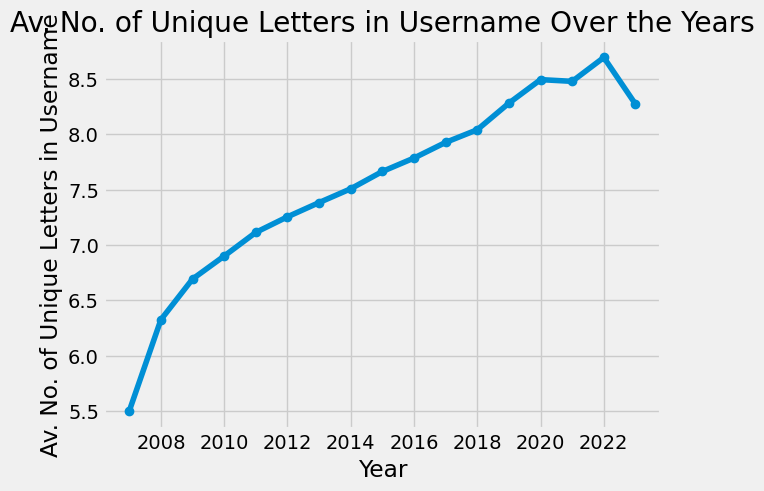

In [15]:
import matplotlib.pyplot as plt

# Group the data by year and calculate the mean of the letters_username column for each year
mean_letters_by_year = df.groupby('year')['letters_username'].mean()

# Plot a line plot of the mean number of unique letters in usernames over the years
plt.plot(mean_letters_by_year.index, mean_letters_by_year.values, marker='o')

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Av. No. of Unique Letters in Username')
plt.title('Av. No. of Unique Letters in Username Over the Years')

# Show the plot
plt.grid(True)
plt.show()


In [16]:
# checking special characters

import string

# Define a function to count special characters in a username
def count_special_characters(username):
    special_characters = set(string.punctuation)
    return sum(1 for char in username if char in special_characters)

# Apply the function to create a new column 'special_characters_username'
df['special_characters_username'] = df['username'].apply(count_special_characters)


In [17]:
# Use the describe function for the special_characters_username column
description = df['special_characters_username'].describe()

# Display the summary statistics
print(description)

count   140,941.00
mean          0.08
std           0.29
min           0.00
25%           0.00
50%           0.00
75%           0.00
max           7.00
Name: special_characters_username, dtype: float64


In [18]:
# Finding the maximum and minimum number of special characters in usernames
max_special_characters = df['special_characters_username'].max()
min_special_characters = df['special_characters_username'].min()

# Filtering the DataFrame to get the usernames with the maximum and minimum number of special characters
usernames_max_special = df[df['special_characters_username'] == max_special_characters]['username'].tolist()
usernames_min_special = df[df['special_characters_username'] == min_special_characters]['username'].tolist()

# Displaying the usernames
print("Usernames with maximum special characters:", usernames_max_special)
print("Usernames with minimum special characters:", usernames_min_special)



Usernames with maximum special characters: ['A-d-i-t-h-y-a-n']
Usernames with minimum special characters: ['mojombo', 'defunkt', 'pjhyett', 'wycats', 'ezmobius', 'ivey', 'evanphx', 'vanpelt', 'wayneeseguin', 'brynary', 'kevinclark', 'technoweenie', 'macournoyer', 'takeo', 'caged', 'topfunky', 'anotherjesse', 'lukas', 'KirinDave', 'jamesgolick', 'atmos', 'mojodna', 'bmizerany', 'jnewland', 'joshknowles', 'hornbeck', 'reinh', 'bs', 'rsanheim', 'schacon', 'uggedal', 'bruce', 'sam', 'abhay', 'rabble', 'benburkert', 'indirect', 'ry', 'jsierles', 'brixen', 'sr', 'lifo', 'imownbey', 'dylanegan', 'jm', 'BrianTheCoder', 'freeformz', 'hassox', 'automatthew', 'queso', 'lancecarlson', 'drnic', 'danwrong', 'HamptonMakes', 'grempe', 'peterc', 'cristibalan', 'heavysixer', 'brosner', 'danielmorrison', 'danielharan', 'kvnsmth', 'canadaduane', 'sunny', 'dkubb', 'jnicklas', 'josh', 'stevedekorte', 'leahneukirchen', 'technomancy', 'rubyist', 'lazyatom', 'al3x', 'toolmantim', 'nicksieger', 'jicksta', 'josh

In [19]:
# min is 0, therefore no output of username? check! 

In [20]:
# create a column including all unique special characters per username

# Function to count the unique special characters in a username
def count_unique_special_characters(username):
    # List to store the unique special characters
    unique_special_characters = []
    # Iterating through each character in the username
    for char in username:
        # Checking if the character is a special character and if it's not already in the list
        if not char.isalnum() and char not in unique_special_characters:
            # Adding the unique special character to the list
            unique_special_characters.append(char)
    # Returning the count of unique special characters in the username
    return len(unique_special_characters)

# Applying the function to the 'username' column and storing the results in a new column 'unique_special_characters'
df['unique_special_characters'] = df['username'].apply(count_unique_special_characters)



In [21]:
print(df[['unique_special_characters']].head())


   unique_special_characters
0                          0
1                          0
2                          0
3                          0
4                          0


In [22]:
print(df.columns)

Index(['username', 'type', 'site_admin', 'public_repos', 'public_gists',
       'followers', 'following', 'created_at', 'updated_at', 'duration',
       'entropy', 'branding_evaluation', 'standardized_entropy',
       'entropy_classification', 'year', 'length_username', 'letters_username',
       'special_characters_username', 'unique_special_characters'],
      dtype='object')


In [23]:
df.head(20)



,username,type,site_admin,public_repos,public_gists,followers,following,created_at,updated_at,duration,entropy,branding_evaluation,standardized_entropy,entropy_classification,year,length_username,letters_username,special_characters_username,unique_special_characters
0,mojombo,User,False,66,62,23655,11,2007-10-20 05:24:19+00:00,2023-09-18 18:49:27+00:00,5812 days,1.84,Not so good,0.31,Low,2007,7,4,0,0
1,defunkt,User,False,107,273,21736,214,2007-10-20 05:24:19+00:00,2023-09-29 23:19:40+00:00,5823 days,2.81,Not so good,0.47,Medium,2007,7,7,0,0
2,pjhyett,User,False,8,21,8259,30,2008-01-07 17:54:22+00:00,2023-03-20 06:54:31+00:00,5550 days,2.52,Not so good,0.42,Medium,2008,7,6,0,0
3,wycats,User,False,282,761,10152,13,2008-01-12 05:38:33+00:00,2023-09-20 01:24:31+00:00,5729 days,2.58,Not so good,0.43,Medium,2008,6,6,0,0
4,ezmobius,User,False,22,106,545,13,2008-01-12 07:51:46+00:00,2023-09-22 11:24:10+00:00,5732 days,3.00,Not so good,0.50,Medium,2008,8,8,0,0
5,ivey,User,False,37,80,142,3,2008-01-12 15:15:00+00:00,2023-09-22 11:24:10+00:00,5731 days,2.00,Not so good,0.33,Medium,2008,4,4,0,0
6,evanphx,User,False,182,445,1575,7,2008-01-12 16:46:24+00:00,2023-09-18 03:52:40+00:00,5727 days,2.81,Not so good,0.47,Medium,2008,7,7,0,0
7,vanpelt,User,False,58,50,218,20,2008-01-13 05:57:18+00:00,2023-10-09 21:12:41+00:00,5748 days,2.81,Not so good,0.47,Medium,2008,7,7,0,0
8,wayneeseguin,User,False,104,95,729,19,2008-01-13 06:02:21+00:00,2023-10-09 21:22:20+00:00,5748 days,3.02,Not so good,0.51,Medium,2008,12,9,0,0
9,brynary,User,False,171,69,666,29,2008-01-13 10:19:47+00:00,2023-09-25 01:09:26+00:00,5733 days,2.24,Not so good,0.37,Medium,2008,7,5,0,0


In [24]:
# still no entry in unique_special_characters column
# check further

df.tail(20)
# there we can see that we have an entry in the unique_special_characters column. but it seems that this is the same like in 
# special_characters_username

#needs to be checked!

# what we wanted: one column including the count of special characters and one column including kind of string
# showing the special characters per each username itself

# lets try


,username,type,site_admin,public_repos,public_gists,followers,following,created_at,updated_at,duration,entropy,branding_evaluation,standardized_entropy,entropy_classification,year,length_username,letters_username,special_characters_username,unique_special_characters
140921,happier0000,User,False,0,0,147,1152,2023-08-31 17:13:29+00:00,2023-09-19 23:00:45+00:00,19 days,2.55,Not so good,0.43,Medium,2023,11,7,0,0
140922,Reiderade,User,False,23,0,326,471,2023-09-01 14:25:32+00:00,2023-09-04 16:23:34+00:00,3 days,2.42,Not so good,0.40,Medium,2023,9,6,0,0
140923,cvs0,User,False,15,0,92,3373,2023-09-02 04:54:30+00:00,2023-10-10 20:55:15+00:00,38 days,2.00,Not so good,0.33,Medium,2023,4,4,0,0
140924,defusionai,User,False,2,0,79,0,2023-09-04 10:01:27+00:00,2023-09-04 12:53:47+00:00,0 days,3.12,Not so good,0.52,Medium,2023,10,9,0,0
140925,PastorFinny,User,False,2,0,129,2,2023-09-05 00:18:22+00:00,2023-09-05 00:18:22+00:00,0 days,3.28,Not so good,0.55,Medium,2023,11,10,0,0
140926,topstar2023,User,False,17,0,136,271,2023-09-07 17:37:59+00:00,2023-09-25 09:16:24+00:00,17 days,3.10,Not so good,0.52,Medium,2023,11,9,0,0
140927,superdev1003,User,False,7,0,188,267,2023-09-07 18:02:02+00:00,2023-10-05 19:18:40+00:00,28 days,3.25,Not so good,0.54,Medium,2023,12,10,0,0
140928,LOGESH9597,User,False,2,0,57,31,2023-09-08 14:50:49+00:00,2023-10-07 13:03:30+00:00,28 days,3.12,Not so good,0.52,Medium,2023,10,9,0,0
140929,zhile-io,User,False,5,0,788,0,2023-09-10 02:04:45+00:00,2023-09-25 01:58:42+00:00,14 days,2.75,Not so good,0.46,Medium,2023,8,7,1,1
140930,coldiac,User,False,2,0,108,190,2023-09-10 04:02:42+00:00,2023-09-25 04:26:20+00:00,15 days,2.52,Not so good,0.42,Medium,2023,7,6,0,0


In [25]:
# also we could create a column showing the different letters as string per username itself? 
# try later

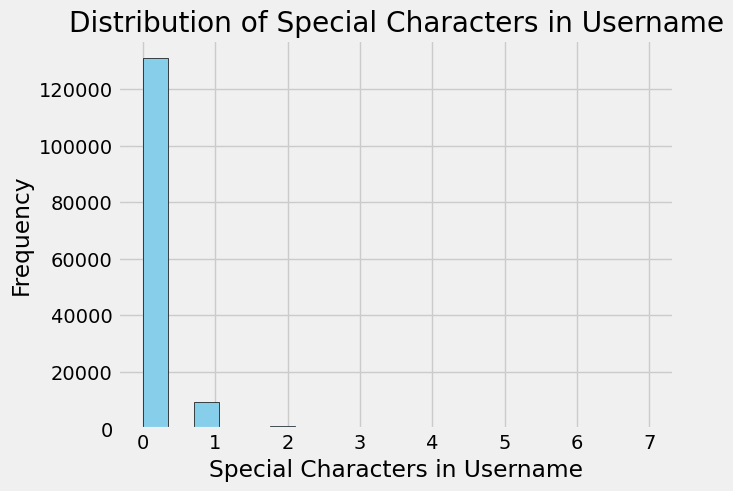

In [26]:
# proceed with viz

import matplotlib.pyplot as plt

# Plot a histogram of the special_characters_username column
plt.hist(df['special_characters_username'], bins=20, color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel('Special Characters in Username')
plt.ylabel('Frequency')
plt.title('Distribution of Special Characters in Username')

# Show the plot
plt.show()


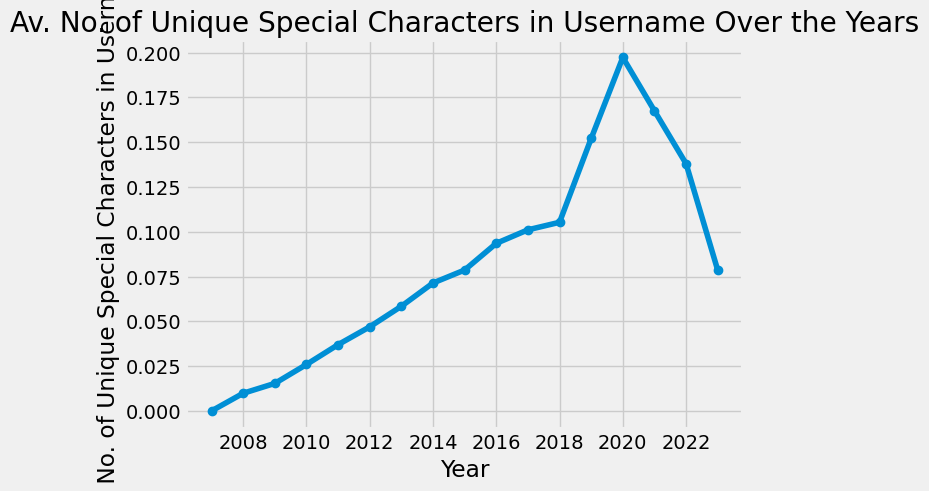

In [27]:
import matplotlib.pyplot as plt

# Group the data by year and calculate the mean of the special_characters_username column for each year
mean_special_characters_by_year = df.groupby('year')['special_characters_username'].mean()

# Plot a line plot of the mean number of unique special characters in usernames over the years
plt.plot(mean_special_characters_by_year.index, mean_special_characters_by_year.values, marker='o')

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Av. No. of Unique Special Characters in Username')
plt.title('Av. No. of Unique Special Characters in Username Over the Years')

# Show the plot
plt.grid(True)
plt.show()


In [28]:
# NLP stuff

#Terminal installation for SpaCy
#pip install spacy


#python -m spacy download en_core_web_sm


In [29]:
import spacy

# Load the pre-trained model for English
nlp = spacy.load("en_core_web_sm")

# Apply NER to each username in the DataFrame
def extract_named_entities(username):
    doc = nlp(username)
    named_entities = [(ent.text, ent.label_) for ent in doc.ents]
    return named_entities

# Apply the function to the entire DataFrame
df['named_entities'] = df['username'].apply(extract_named_entities)


In [30]:
# maybe rename the above column into english version... 

# try English modelling 
In this code, SpaCy is used to extract Named Entities in each username in the DataFrame. Here are some details:

First, the pre-trained model for English is loaded. 

In this case, the model "en_core_web_sm" is used, which is a smaller model and suitable for general tasks such as Named Entity Recognition (NER).

A function called extract_named_entities is defined, which receives a user name as input. This function applies NER to the user name by using the nlp object (SpaCy model) to create a document from the user name. It then extracts the named entities from this document and returns them as a list of tuples (text, label), where text contains the text of the named entity and label contains the type of entity (e.g. PERSON, ORGANIZATION, etc.).
The extract_named_entities function is then applied to the entire "username" column in the DataFrame to extract named entities for each username. The result is stored in a new column called "named_entities" in the DataFrame.
In this way, a list of named entities is extracted for each username in the DataFrame and stored in the "named_entities" column.

# try German modelling 
In this case, the model "de_core_web_sm" is used,

In [31]:
# terminal : python -m spacy download de_core_news_sm

In [32]:
import spacy

# Load the pre-trained model for German
nlp_de = spacy.load("de_core_news_sm")

# Function to extract named entities from a German text
def extract_named_entities_de(username):
    doc = nlp_de(username)
    named_entities = [(ent.text, ent.label_) for ent in doc.ents]
    return named_entities

# Apply the function to the entire DataFrame
df['named_entities_german'] = df['username'].apply(extract_named_entities_de)


In [33]:
df.head()

,username,type,site_admin,public_repos,public_gists,followers,following,created_at,updated_at,duration,...,branding_evaluation,standardized_entropy,entropy_classification,year,length_username,letters_username,special_characters_username,unique_special_characters,named_entities,named_entities_german
0,mojombo,User,False,66,62,23655,11,2007-10-20 05:24:19+00:00,2023-09-18 18:49:27+00:00,5812 days,...,Not so good,0.31,Low,2007,7,4,0,0,[],[]
1,defunkt,User,False,107,273,21736,214,2007-10-20 05:24:19+00:00,2023-09-29 23:19:40+00:00,5823 days,...,Not so good,0.47,Medium,2007,7,7,0,0,[],[]
2,pjhyett,User,False,8,21,8259,30,2008-01-07 17:54:22+00:00,2023-03-20 06:54:31+00:00,5550 days,...,Not so good,0.42,Medium,2008,7,6,0,0,[],[]
3,wycats,User,False,282,761,10152,13,2008-01-12 05:38:33+00:00,2023-09-20 01:24:31+00:00,5729 days,...,Not so good,0.43,Medium,2008,6,6,0,0,[],"[(wycats, PER)]"
4,ezmobius,User,False,22,106,545,13,2008-01-12 07:51:46+00:00,2023-09-22 11:24:10+00:00,5732 days,...,Not so good,0.50,Medium,2008,8,8,0,0,[],"[(ezmobius, PER)]"


In [34]:
# here there are no entries in the new column named entity

# Iterate over the DataFrame and check for non-empty named entity values
for index, row in df.iterrows():
    named_entities = row['named_entities']
    if named_entities:
        print(f"At index {index}, named entities found: {named_entities}")
    else:
        print(f"At index {index}, no named entities found.")


At index 0, no named entities found.
At index 1, no named entities found.
At index 2, no named entities found.
At index 3, no named entities found.
At index 4, no named entities found.
At index 5, no named entities found.
At index 6, no named entities found.
At index 7, no named entities found.
At index 8, no named entities found.
At index 9, no named entities found.
At index 10, named entities found: [('kevinclark', 'PERSON')]
At index 11, no named entities found.
At index 12, named entities found: [('macournoyer', 'PERSON')]
At index 13, no named entities found.
At index 14, no named entities found.
At index 15, no named entities found.
At index 16, no named entities found.
At index 17, no named entities found.
At index 18, named entities found: [('KirinDave', 'PRODUCT')]
At index 19, no named entities found.
At index 20, no named entities found.
At index 21, no named entities found.
At index 22, no named entities found.
At index 23, no named entities found.
At index 24, no named ent

In [35]:
# here there are no entries in the new column named_entities_german

# Iterate over the DataFrame and check for non-empty named entity german values
for index, row in df.iterrows():
    named_entities_german = row['named_entities_german']
    if named_entities_german:
        print(f"At index {index}, named entities german found: {named_entities_german}")
    else:
        print(f"At index {index}, no named entities german found.")

At index 0, no named entities german found.
At index 1, no named entities german found.
At index 2, no named entities german found.
At index 3, named entities german found: [('wycats', 'PER')]
At index 4, named entities german found: [('ezmobius', 'PER')]
At index 5, named entities german found: [('ivey', 'PER')]
At index 6, no named entities german found.
At index 7, no named entities german found.
At index 8, no named entities german found.
At index 9, no named entities german found.
At index 10, named entities german found: [('kevinclark', 'LOC')]
At index 11, no named entities german found.
At index 12, named entities german found: [('macournoyer', 'LOC')]
At index 13, no named entities german found.
At index 14, named entities german found: [('caged', 'LOC')]
At index 15, named entities german found: [('topfunky', 'PER')]
At index 16, no named entities german found.
At index 17, no named entities german found.
At index 18, named entities german found: [('KirinDave', 'ORG')]
At ind

In [36]:
# how many named entities could be found? in total? 

# Initialize a variable to store the total count of named entities
total_named_entities = 0

# Iterate over the named entities column and count non-empty values
for named_entities in df['named_entities']:
    if named_entities:
        total_named_entities += len(named_entities)

# Print the total count of named entities
print("Total number of found named entities:", total_named_entities)


Total number of found named entities: 38600


In [37]:
# how many named entities german could be found? in total? 

# Initialize a variable to store the total count of named entities german
total_named_entities_german = 0

# Iterate over the named entities german column and count non-empty values
for named_entities_german in df['named_entities_german']:
    if named_entities_german:
        total_named_entities_german += len(named_entities_german)

# Print the total count of named entities german
print("Total number of found named entities german:", total_named_entities_german)

Total number of found named entities german: 85901


In [38]:
#At index 10, named entities found: [('kevinclark', 'PERSON')]

# does PERSON mean a special assignment to the extracted component? 

In the output you provided, "PERSON" seems to refer to the type of named entity identified by the spaCy model. In this case, it indicates that "kevinclark" is recognized as a person's name? true? 
SpaCy recognizes various types of named entities, such as persons, organizations, locations, dates, and more. In this context, "PERSON" specifically identifies a named entity representing a person.

In [39]:
# check how many unique types SpaCy here in our df has found? 

# Initialize a dictionary to count the occurrences of each named entity type
entity_types_count = {}

# Iterate over the named entities found in each row and count the occurrences of each type
for entities in df['named_entities']:
    for entity in entities:
        entity_type = entity[1]  # Extract the entity type
        if entity_type in entity_types_count:
            entity_types_count[entity_type] += 1
        else:
            entity_types_count[entity_type] = 1

# Display the count of occurrences for each named entity type
for entity_type, count in entity_types_count.items():
    print(f"{entity_type}: {count}")


PERSON: 15034
PRODUCT: 499
NORP: 1394
GPE: 5023
ORG: 14773
LAW: 12
CARDINAL: 990
DATE: 425
TIME: 216
WORK_OF_ART: 68
MONEY: 9
ORDINAL: 112
LOC: 18
EVENT: 6
LANGUAGE: 1
FAC: 12
QUANTITY: 7
PERCENT: 1


In [51]:
# check which work_of_art components we can found / means kind of artwork

# Filter the DataFrame to include only rows with named entities of type "WORK_OF_ART"
work_of_art_entities = df[df['named_entities'].apply(lambda x: any(ent[1] == 'WORK_OF_ART' for ent in x))]

# Display the filtered DataFrame
print(work_of_art_entities)


              username  type  site_admin  public_repos  public_gists  \
1762            rhaamo  User       False            68           138   
2168          lukaszx0  User       False            62            48   
9666         Mistobaan  User       False           907           103   
21325         nesteruk  User       False            18            37   
23975         weezykon  User       False           149             4   
...                ...   ...         ...           ...           ...   
137496  Greymattersbot  User       False            56             0   
139317     YasmineElbh  User       False            10             0   
139456   maithuong0711  User       False             0             0   
139918        ziba1988  User       False             4             0   
140267         laoman5  User       False            10             0   

        followers  following                 created_at  \
1762           87         41  2008-04-27 11:23:58+00:00   
2168          266

In [ ]:
# artwork not interesting here... 

# check for what those types (en-pkg) stands for?

PERSON: Individual people, including fictional.
PRODUCT: Objects, vehicles, foods, etc. (not services).
NORP: Nationalities or religious or political groups.
GPE: Countries, cities, states.
ORG: Companies, agencies, institutions, etc.
LAW: Named documents made into laws.
CARDINAL: Numerals that do not fall under another type.
DATE: Absolute or relative dates or periods.
TIME: Times smaller than a day.
WORK_OF_ART: Titles of books, songs, etc.
MONEY: Monetary values, including unit.
ORDINAL: "first", "second", etc.
LOC: Non-GPE locations, mountain ranges, bodies of water.
EVENT: Named hurricanes, battles, wars, sports events, etc.
LANGUAGE: Any named language.
FAC: Buildings, airports, highways, bridges, etc.
QUANTITY: Measurements, as of weight or distance.
PERCENT: Percentage, including "%" sign.


In [40]:
# check how many unique types SpaCy here in our df has found? 

# Initialize a dictionary to count the occurrences of each named entity type german
entity_types_count = {}

# Iterate over the named entities german found in each row and count the occurrences of each type
for entities in df['named_entities_german']:
    for entity in entities:
        entity_type = entity[1]  # Extract the entity type
        if entity_type in entity_types_count:
            entity_types_count[entity_type] += 1
        else:
            entity_types_count[entity_type] = 1

# Display the count of occurrences for each named entity type german
for entity_type, count in entity_types_count.items():
    print(f"{entity_type}: {count}")

PER: 36986
LOC: 20836
ORG: 11468
MISC: 16611


# check for what those types (de-pkg) stands for?

PERSON: People, including fictional characters.
ORG: Organizations, companies, institutions, etc.
LOC: Locations, including countries, cities, etc.
MISC: Miscellaneous entities that do not fall into the above categories.

In [41]:
# german and english pkg seems to have different variance of types of components


it seems that the English-language dataset has more distinct entity types compared to the German-language dataset. In the English dataset, there are entity types like PRODUCT, NORP (Nationalities or Religious or Political Groups), LAW, CARDINAL, TIME, WORK_OF_ART, MONEY, ORDINAL, EVENT, LANGUAGE, FAC (Buildings, airports, highways, bridges, etc.), QUANTITY, and PERCENT, which are not present in the German dataset.

In [42]:
# skills extracten? 

In [44]:
import spacy
import pandas as pd

# Load the pre-trained model for English
nlp = spacy.load("en_core_web_sm")

# Function to extract skills from text
def extract_skills(text):
    doc = nlp(text)
    skills = [ent.text for ent in doc.ents if ent.label_ == "SKILL"]
    return skills

# Extract skills from usernames and add a new column
df['skills'] = df['username'].apply(extract_skills)

# Display the DataFrame with extracted skills
print(df)


                     username  type  site_admin  public_repos  public_gists  \
0                     mojombo  User       False            66            62   
1                     defunkt  User       False           107           273   
2                     pjhyett  User       False             8            21   
3                      wycats  User       False           282           761   
4                    ezmobius  User       False            22           106   
...                       ...   ...         ...           ...           ...   
140936           MadheswaranU  User       False             2             0   
140937              Rizuvanul  User       False             0             0   
140938  NISHANTHISENTHILKUMAR  User       False             0             0   
140939           dredwardhyde  User       False             7             0   
140940         Bundlr-Network  User       False             0             0   

        followers  following                 create

In [48]:
# Display the first five rows of the 'skills' column
print(df['skills'].head())


0    []
1    []
2    []
3    []
4    []
Name: skills, dtype: object


In [49]:
# check whether the skill extraction worked? are there are rows of the skills column filled ? 

# Check if the 'skills' column is empty using the empty attribute
if df['skills'].empty:
    print("The 'skills' column is empty.")
else:
    print("The 'skills' column is not empty.")

# Check if the 'skills' column is empty by summing the non-null values
if df['skills'].notnull().sum() == 0:
    print("The 'skills' column is empty.")
else:
    print("The 'skills' column is not empty.")


The 'skills' column is not empty.
The 'skills' column is not empty.


In [50]:
# Count the number of non-empty rows in the 'skills' column
skills_count = df['skills'].apply(len).astype(bool).sum()
print("Number of non-empty rows in the 'skills' column:", skills_count)


Number of non-empty rows in the 'skills' column: 0


In [ ]:
# so maybe this does not work? check later! 

In [52]:
# try sth. else and searching for job related components which should be defined in advance e.g.

import spacy

# Load the pre-trained NLP model
nlp = spacy.load("en_core_web_sm")

# Define keywords or phrases
keywords = ["Python", "SQL", "Tableau", "Code", "Coden"]

# Function to extract usernames with relevant keywords
def extract_job_related_usernames(df):
    job_related_usernames = []
    for username in df['username']:
        doc = nlp(username)
        for token in doc:
            if token.text in keywords:
                job_related_usernames.append(username)
                break  # Once a keyword is found, move to the next username
    return job_related_usernames

# Extract usernames with relevant keywords
job_related_usernames = extract_job_related_usernames(df)

# Display the extracted usernames
print(job_related_usernames)


['Code-Hex', 'SQL-MisterMagoo', 'Python-IoT', 'Code-Bullet', 'Python-Rookie', 'Code-N-Code', 'Code-Oz', 'Andy-Python-Programmer', 'Compiled-Code', '01010110-Code', 'Code-With-juna', '4-Leafs-Code', 'Code-With-Hashim', 'Xyaa-Code']


In [53]:
# Count the number of job-related usernames
job_related_usernames_count = len(job_related_usernames)

# Display the count
print("Number of job-related usernames:", job_related_usernames_count)


Number of job-related usernames: 14
